In [1]:
import importlib.util
import sys
from pathlib import Path
custom_rqa_path = Path("RQA-and-mrDMD") / "CustomRQA.py"

spec = importlib.util.spec_from_file_location("CustomRQA", str(custom_rqa_path))

CustomRQA = importlib.util.module_from_spec(spec)

spec.loader.exec_module(CustomRQA)

sys.modules["CustomRQA"] = CustomRQA



truncate_path = Path("RQA-and-mrDMD") / "truncate.py"

spec = importlib.util.spec_from_file_location("truncate", str(truncate_path))

truncate = importlib.util.module_from_spec(spec)

spec.loader.exec_module(truncate)

sys.modules["truncate"] = truncate

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.integrate import odeint
%pip install pydmd
%pip install statsmodels
from pydmd import DMD, BOPDMD, MrDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
import warnings
warnings.filterwarnings('ignore')
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
import CustomRQA as rqa
import truncate as tr

url = 'RQA-and-mrDMD/Turbulence/Data/mixingdata2187.npy'
x = np.load(url)
total_t = 40.44
n_tgt = 1012
dt = total_t / (n_tgt - 1)
t = np.linspace(0, total_t, n_tgt)

print(dt, t)
X = StandardScaler().fit_transform(x)
print(X.shape)

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
0.04 [0.000e+00 4.000e-02 8.000e-02 ... 4.036e+01 4.040e+01 4.044e+01]
(2187, 1012)


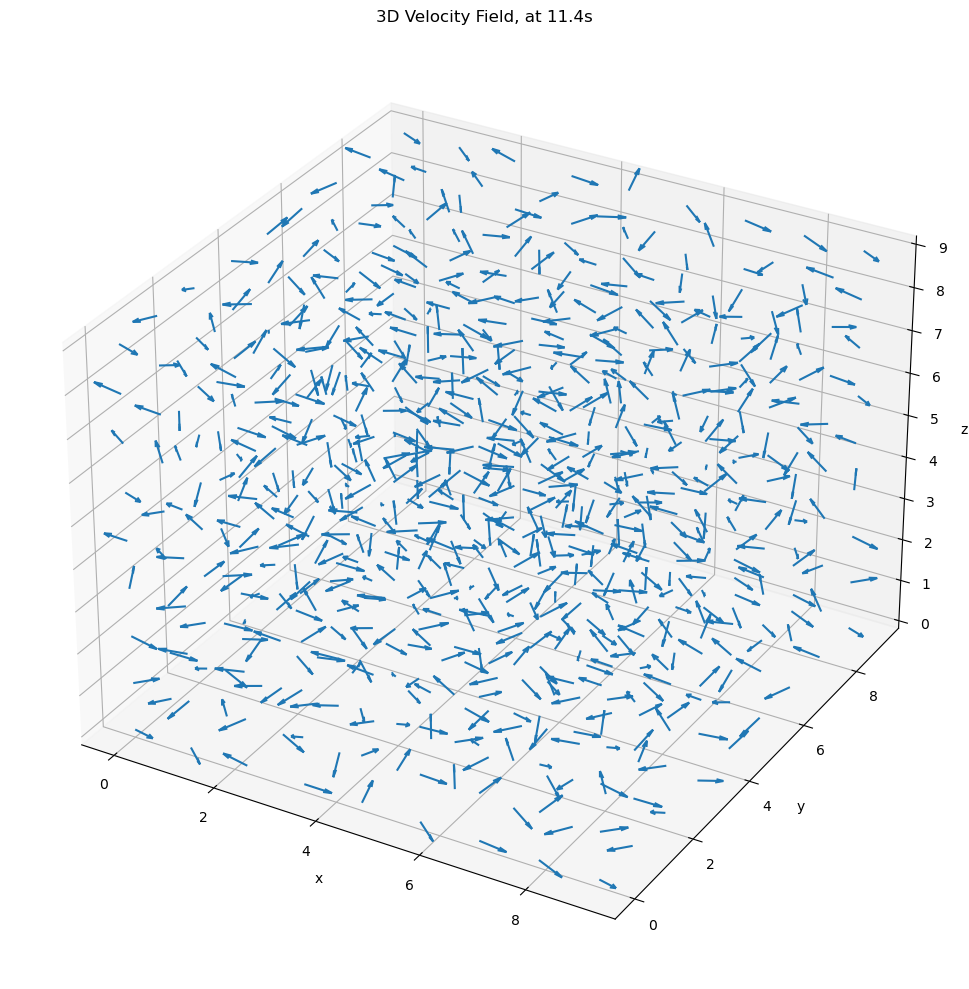

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  

nx, ny, nz = 9, 9, 9
m, nSnapshots = X.shape
nVel = 3
nPoints = m // nVel

assert nx*ny*nz == nPoints, (
    f"Grid size mismatch: {nx}×{ny}×{nz} = {nx*ny*nz} points, "
    f"but m/nVel = {nPoints}"
)

Lx, Ly, Lz = 9.0, 9.0, 9.0

x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
z = np.linspace(0, Lz, nz)
Xg, Yg, Zg = np.meshgrid(x, y, z, indexing='ij')  
# 11.4 seconds, max KE
i_snap = 286
physical_time = i_snap * 0.04 - 0.04   


snap = X[:, i_snap]                    
vel  = snap.reshape(nPoints, nVel)    
U3d  = vel[:, 0].reshape((nx, ny, nz))
V3d  = vel[:, 1].reshape((nx, ny, nz))
W3d  = vel[:, 2].reshape((nx, ny, nz))

fig = plt.figure(figsize=(10, 10))
ax  = fig.add_subplot(projection='3d')
ax.quiver(
    Xg.ravel(), Yg.ravel(), Zg.ravel(),
    U3d.ravel(), V3d.ravel(), W3d.ravel(),
    length=0.5, normalize=True
)



ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_zlabel('z')
ax.set_title(f'3D Velocity Field, at {physical_time}s')
plt.tight_layout()
plt.show()



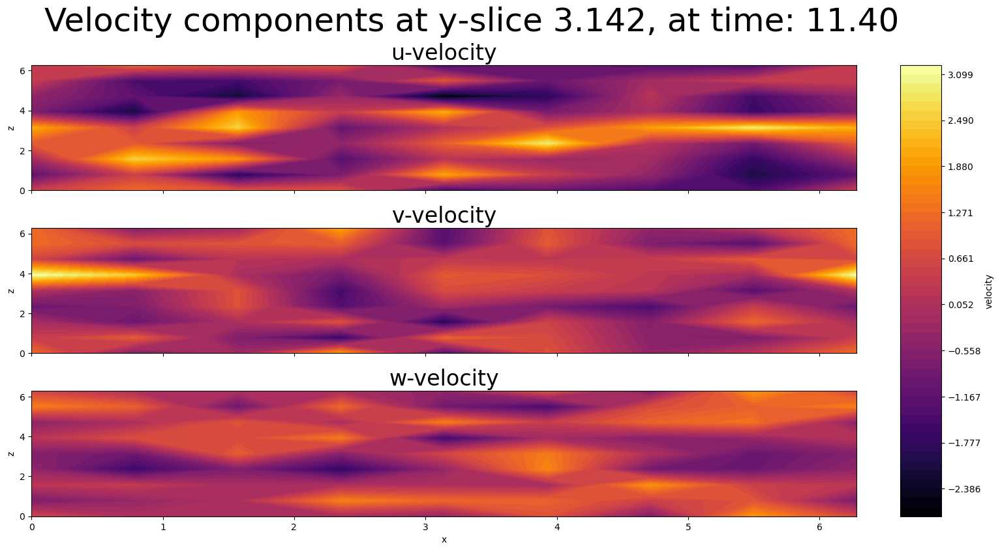

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

nx, ny, nz = 9, 9, 9
nVel, nPoints = 3, nx*ny*nz

i_snap = 286  
physical_time = i_snap * 0.04 - 0.04   
vel4d = X[:, i_snap].reshape((nPoints, nVel))
U3d   = vel4d[:, 0].reshape((nx, ny, nz))
V3d   = vel4d[:, 1].reshape((nx, ny, nz))
W3d   = vel4d[:, 2].reshape((nx, ny, nz))

x = np.linspace(0, 2*np.pi, nx)
y = np.linspace(0, 2*np.pi, ny)
z = np.linspace(0, 2*np.pi, nz)
Xg, Yg, Zg = np.meshgrid(x, y, z, indexing='ij')

k = ny // 2
y_point = y[k]

all_vals = np.hstack([
    U3d[:, k, :].ravel(),
    V3d[:, k, :].ravel(),
    W3d[:, k, :].ravel()
])
levels = np.linspace(all_vals.min(), all_vals.max(), 50)

fig = plt.figure(figsize=(18, 9))
gs  = gridspec.GridSpec(3, 2,
                        width_ratios=[1, 0.05],
                        wspace=0.1, hspace=0.3)

axs = [fig.add_subplot(gs[i, 0]) for i in range(3)]
components = [('u', U3d), ('v', V3d), ('w', W3d)]
for ax, (name, field) in zip(axs, components):
    cf = ax.contourf(
        Xg[:, k, :], Zg[:, k, :], field[:, k, :],
        levels=levels, cmap='inferno'
    )
    ax.set_title(f"{name}-velocity",  fontsize=24)
    ax.set_ylabel('z')
    if ax is not axs[-1]:
        ax.set_xticklabels([])   
    else:
        ax.set_xlabel('x')

cax = fig.add_subplot(gs[:, 1])
cbar = fig.colorbar(cf, cax=cax)
cbar.set_label('velocity')

# super-title
fig.suptitle(f"Velocity components at y‑slice {y_point:.3f}, at time: {physical_time:.2f}", fontsize=36)
plt.tight_layout(rect=[0, 0, 0.95, 0.93])
plt.show()



In [5]:
import plotly.graph_objects as go
import numpy as np

# (re‑use Xg, Yg, Zg, U3d from above)

k = nz//2
fig = go.Figure(data=go.Surface(
    x=Xg[:,:,k], y=Yg[:,:,k], z=U3d[:,:,k],    # plotting u as “height”
    colorscale='Inferno',
    colorbar=dict(title='u‑vel')
))

fig.update_layout(
    scene=dict(
        xaxis_title='x', yaxis_title='y', zaxis_title='u‑velocity',
        aspectmode='cube'
    ),
    title=f'u at z‑slice {k}, snapshot {i_snap}'
)
fig.show()


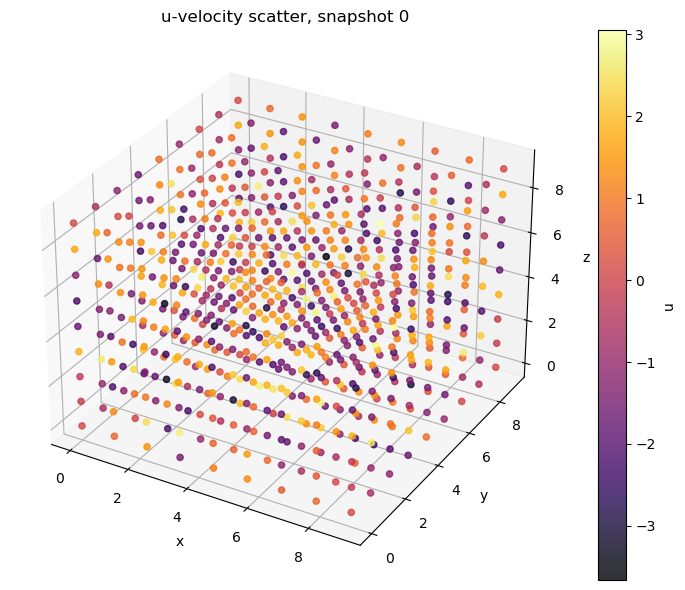

In [6]:
import numpy as np
import matplotlib.pyplot as plt

nx, ny, nz = 9, 9, 9
nVel = 3
nPoints = nx * ny * nz

i_snap, comp = 0, 0

vel4d = X[:, i_snap].reshape((nPoints, nVel))
U3d   = vel4d[:, comp].reshape((nx, ny, nz))

# build physical grid
x = np.linspace(0, 9, nx)
y = np.linspace(0, 9, ny)
z = np.linspace(0, 9, nz)
Xg, Yg, Zg = np.meshgrid(x, y, z, indexing='ij')

fig = plt.figure(figsize=(8,6))
ax  = fig.add_subplot(111, projection='3d')

pts = ax.scatter(
    Xg.ravel(), Yg.ravel(), Zg.ravel(),
    c=U3d.ravel(), cmap='inferno',
    marker='o', s=20, alpha=0.8
)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title(f'u‑velocity scatter, snapshot {i_snap}')
fig.colorbar(pts, ax=ax, label='u')
plt.tight_layout()
plt.show()


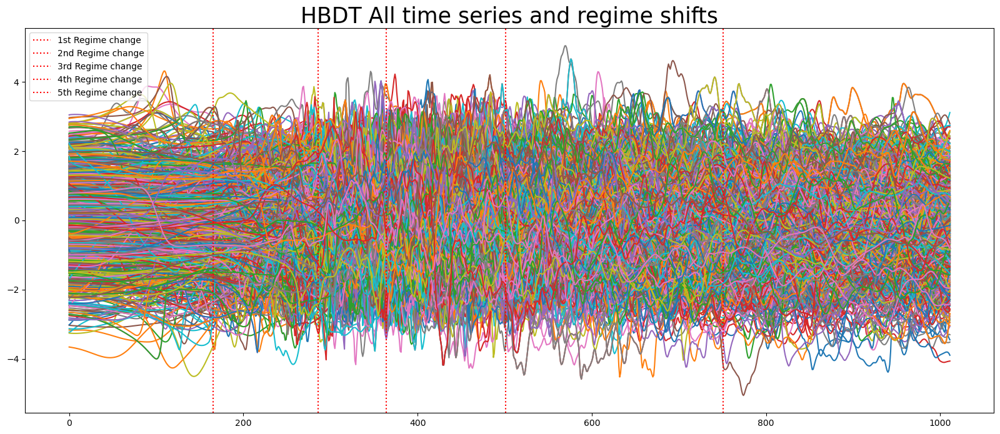

In [7]:
plt.figure(figsize=(20,8))
for i in range(X.shape[0]):
    plt.plot(X[i] )
plt.title('HBDT All time series and regime shifts', fontsize = 25)
plt.axvline(165, color='red', linestyle='dotted', label='1st Regime change')
plt.axvline(286, color='red', linestyle='dotted', label='2nd Regime change')
plt.axvline(364, color='red', linestyle='dotted', label='3rd Regime change')
plt.axvline(501, color='red', linestyle='dotted', label='4th Regime change')
plt.axvline(751, color='red', linestyle='dotted', label='5th Regime change')
plt.legend()
plt.show()

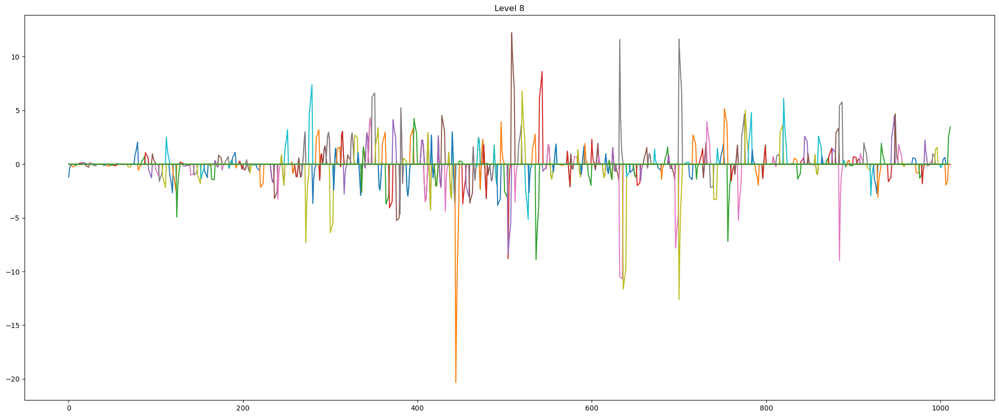

In [8]:
sub_dmd = DMD(svd_rank=0.75)
l=8
# X = X[:,286:]
mrdmd = MrDMD(sub_dmd, max_level=l, max_cycles=1)
mrdmd.fit(X)
for j in range(l,l+1):
    last_dynamics = mrdmd.partial_dynamics(level=j)
    last_modes =  mrdmd.partial_modes(level=j)
    last_eigs =  mrdmd.partial_eigs(level=j)
    plt.figure(figsize=(25,10))
    for i in range(last_dynamics.shape[0]):
        plt.plot(last_dynamics[i])
    plt.title(f'Level {j}')
    plt.show()

In [9]:
df_dynamics = tr.correlation_truncate(last_dynamics.T, threshold = 0.80)
all_vectors_new = df_dynamics.to_numpy()


In [10]:
all_vectors = all_vectors_new
print(all_vectors_new.shape)
p=10

(1012, 247)


epsilon = 0.545


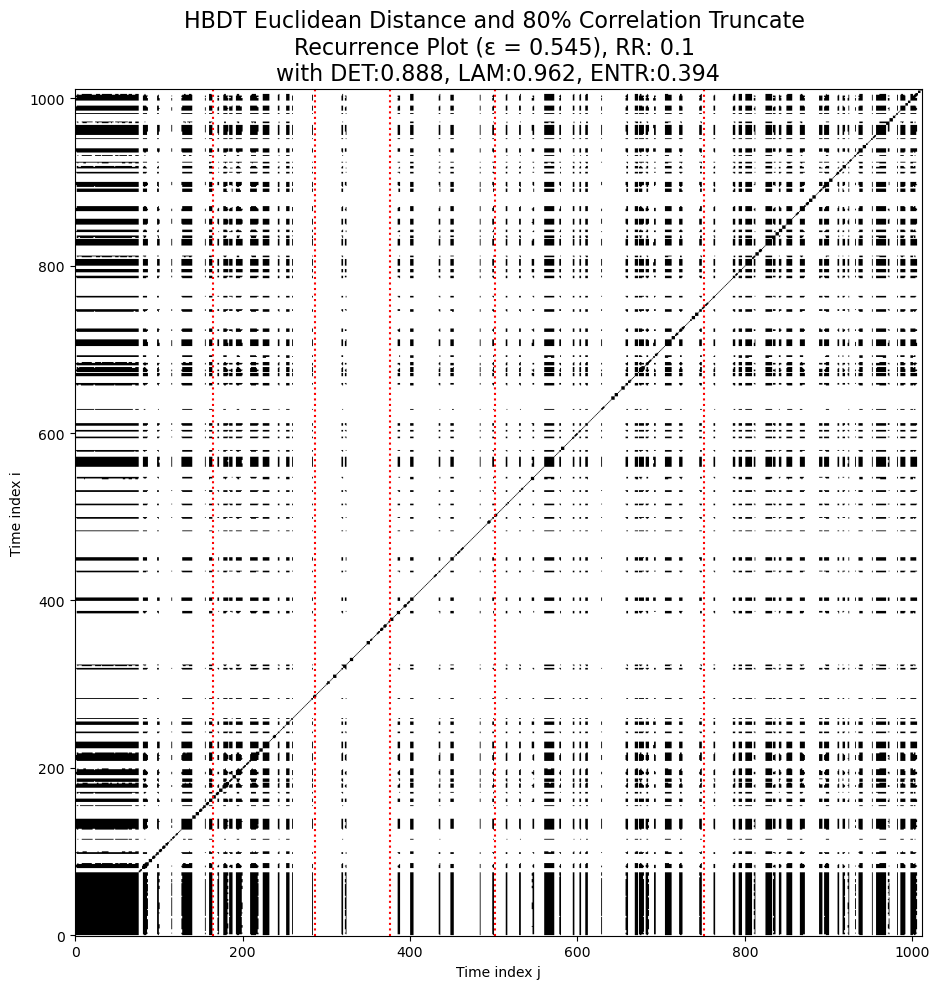

In [11]:
metrics = rqa.RecurrencePlot(all_vectors, percent=p, metric ='euclidean', globalEpsilon=True, Title = 'HBDT Euclidean Distance and 80% Correlation Truncate',lines = True)

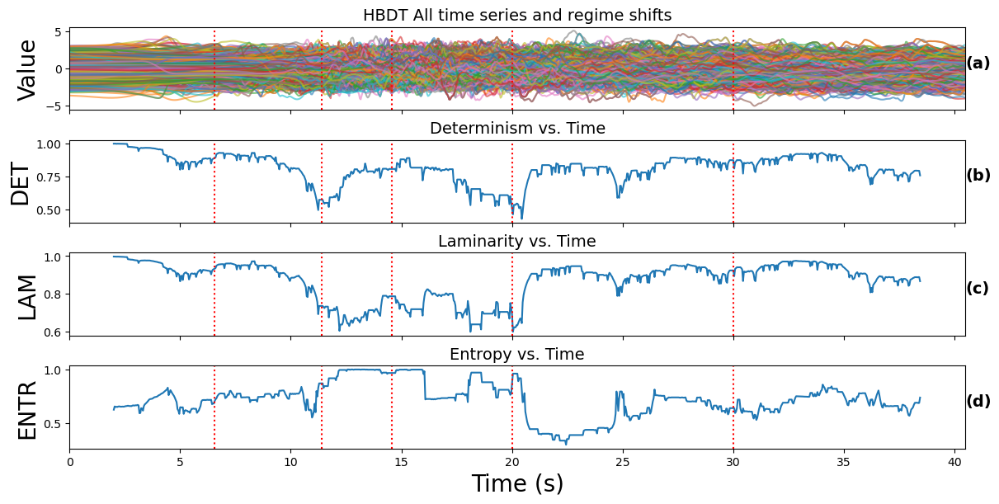

In [12]:
dt = 0.04
window_size = int(0.1 * all_vectors.shape[0])

# compute RQA
times, DETS, LAMS, ENTRS = rqa.sliding_window_rqa(
    all_vectors, p, metric='euclidean', q=1,
    window_size=window_size, step=1,
    l_min=2, v_min=2, globalEpsilon=True
)

# real‑time axes
real_times = times * dt
total_time = X.shape[1] * dt
time_axis = np.arange(X.shape[1]) * dt

regime_times = [6.56, 11.4, 14.56, 20.0, 30.0]
regime_kwargs = dict(color='red', linestyle='dotted')

fig, axes = plt.subplots(4, 1, sharex=True, figsize=(12, 6), constrained_layout=True)

labels = ['(a)', '(b)', '(c)', '(d)']

for row in X:
    axes[0].plot(time_axis, row, alpha=0.6)
axes[0].set_ylabel('Value', fontsize=20)
axes[0].set_title('HBDT All time series and regime shifts', fontsize=14)
for t in regime_times:
    axes[0].axvline(t, **regime_kwargs)
axes[0].text(1, 0.51, labels[0], transform=axes[0].transAxes,
             fontsize=14, fontweight='bold')

axes[1].plot(real_times, DETS)
axes[1].set_ylabel('DET', fontsize=20)
axes[1].set_title('Determinism vs. Time', fontsize=14)
for t in regime_times:
    axes[1].axvline(t, **regime_kwargs)
axes[1].text(1, 0.51, labels[1], transform=axes[1].transAxes,
             fontsize=14, fontweight='bold')

axes[2].plot(real_times, LAMS)
axes[2].set_ylabel('LAM', fontsize=20)
axes[2].set_title('Laminarity vs. Time', fontsize=14)
for t in regime_times:
    axes[2].axvline(t, **regime_kwargs)
axes[2].text(1, 0.51, labels[2], transform=axes[2].transAxes,
             fontsize=14, fontweight='bold')

axes[3].plot(real_times, ENTRS)
axes[3].set_ylabel('ENTR', fontsize=20)
axes[3].set_title('Entropy vs. Time', fontsize=14)
for t in regime_times:
    axes[3].axvline(t, **regime_kwargs)
axes[3].text(1,0.51, labels[3], transform=axes[3].transAxes,
             fontsize=14, fontweight='bold')

axes[3].set_xlabel('Time (s)', fontsize=20)
axes[3].set_xlim(0, total_time)

plt.show()
